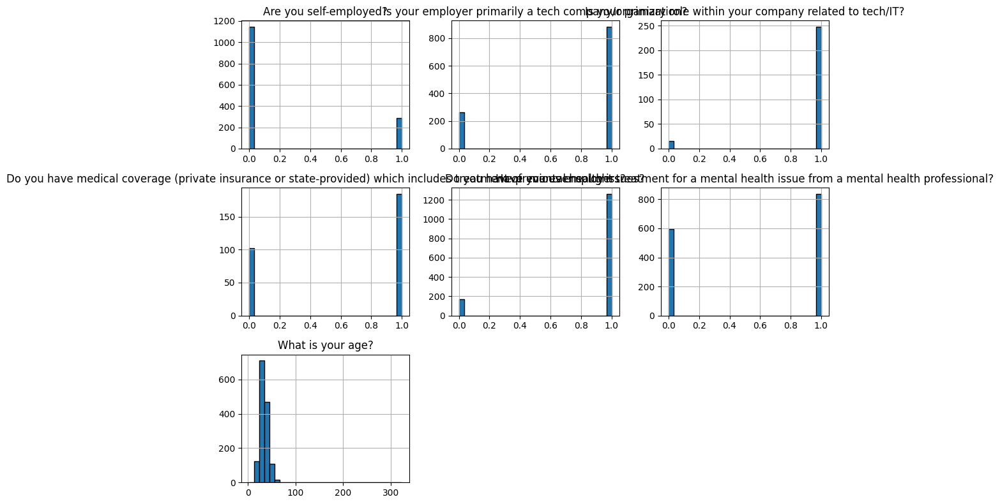

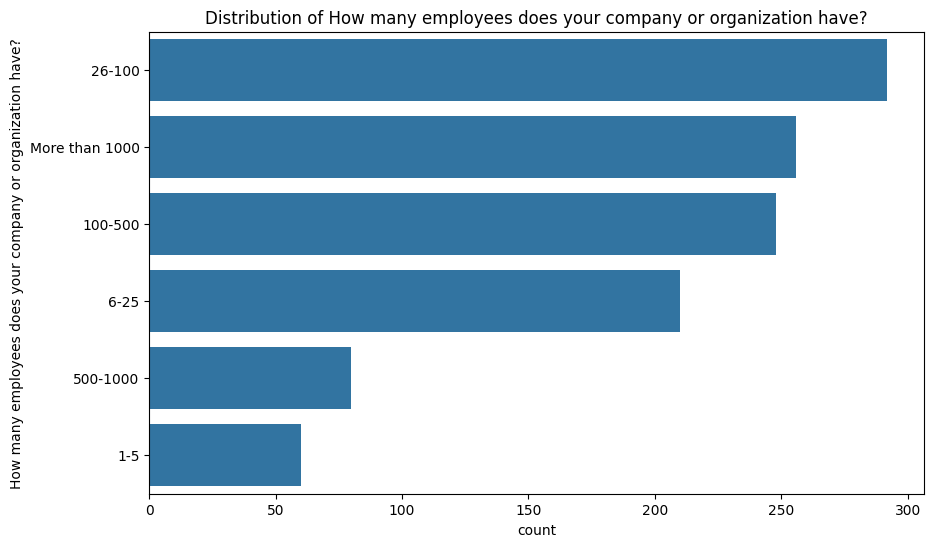

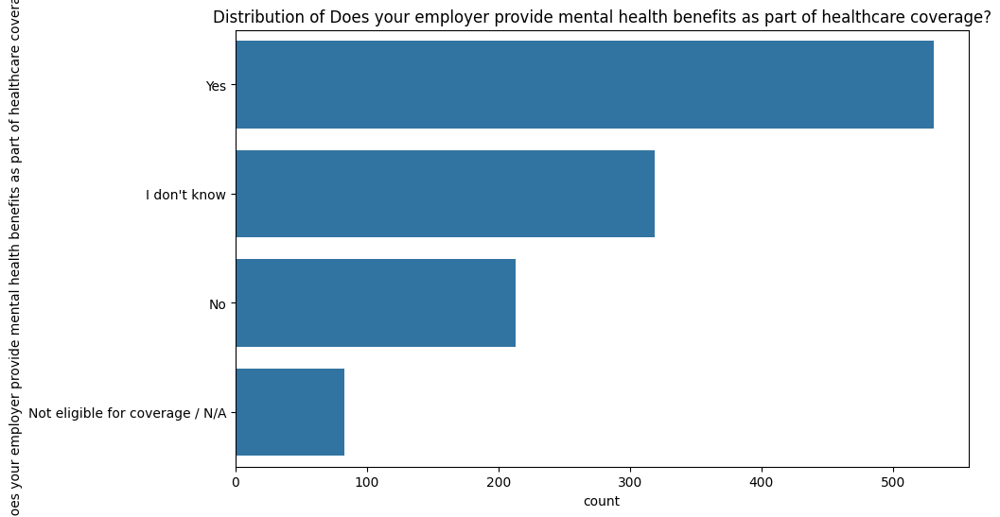

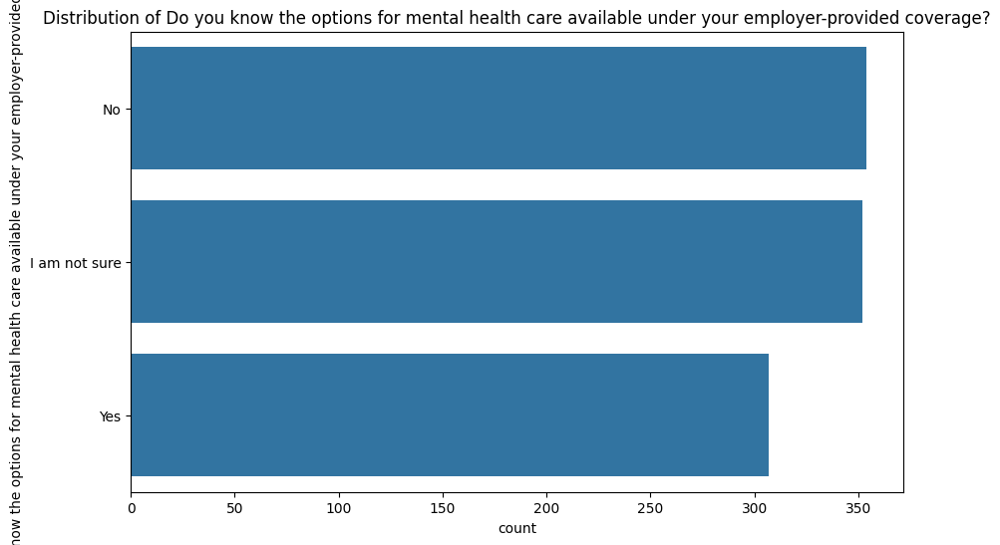

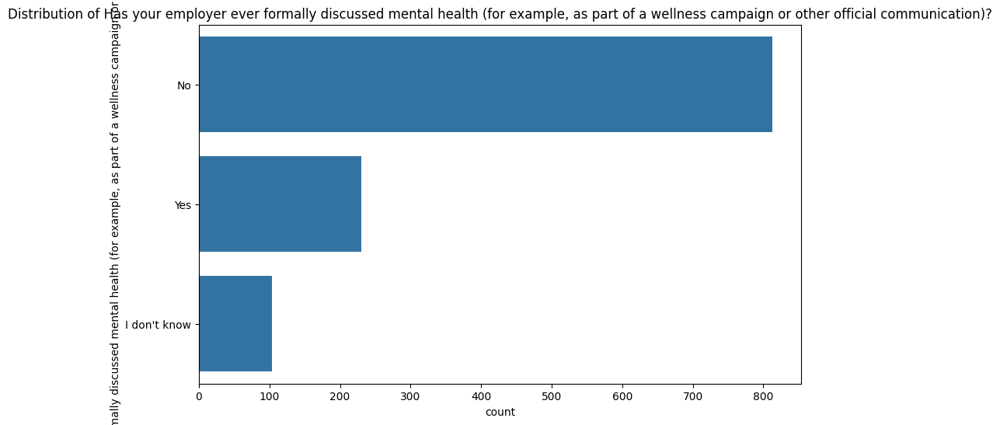

...

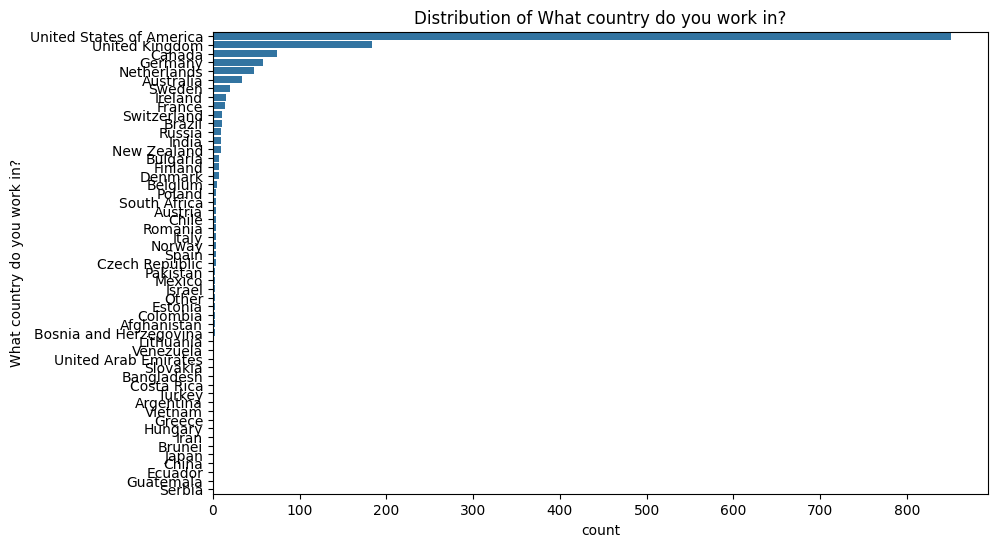

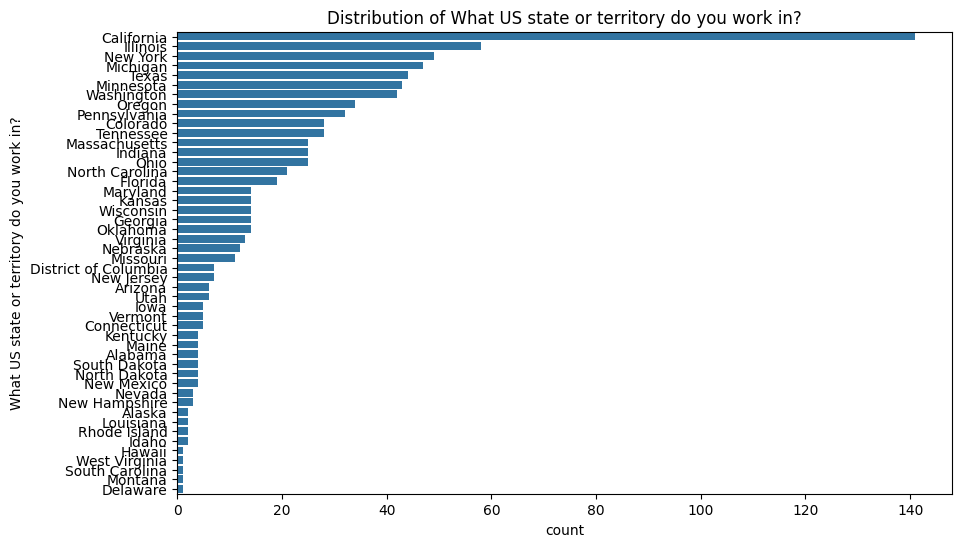

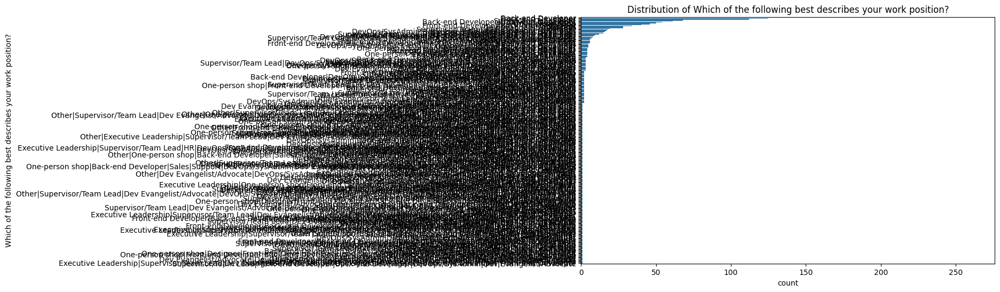

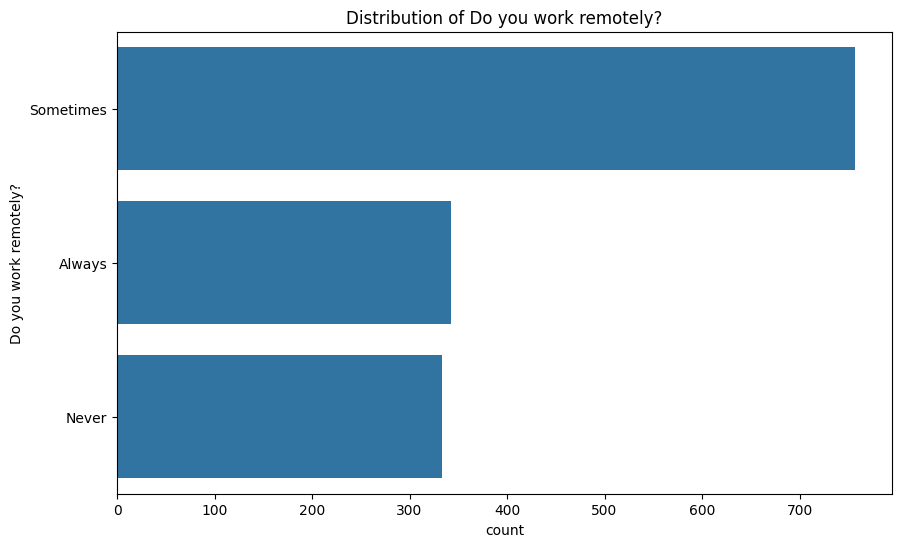

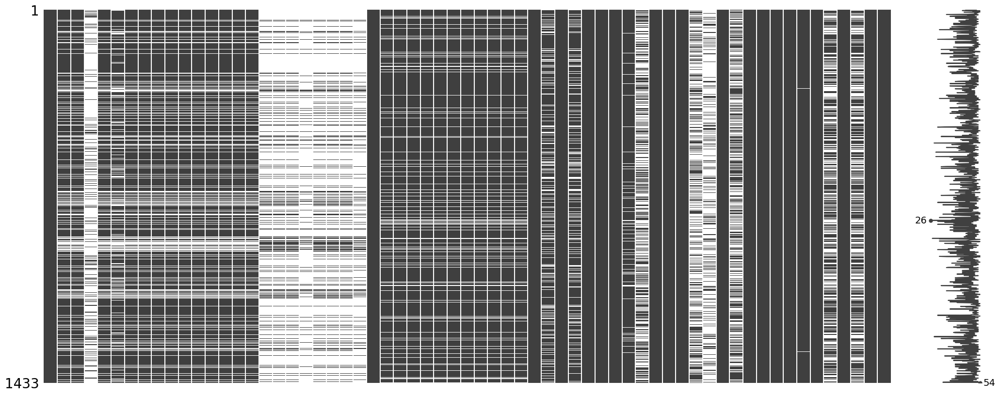

In [49]:

# Display the first few rows of the dataset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Load the dataset
file_path = 'C:\\Users\\Hp\\Documents\\MentalHealthTechCaseStudy\\mental-heath-in-tech-2016_20161114.csv'
data = pd.read_csv(file_path)

# Plot histograms for numerical features
data.hist(figsize=(10, 8), bins=30, edgecolor='black')
plt.tight_layout()
plt.show()

# Plot bar plots for categorical features
for column in data.select_dtypes(include=['object']).columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=column, data=data, order=data[column].value_counts().index)
    plt.title(f'Distribution of {column}')
    plt.show()

# Visualize missing data
msno.matrix(data)
plt.show()


In [50]:
# Summary statistics for numerical features
data.describe()


,Are you self-employed?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?
count,1433.000000,1146.000000,263.000000,287.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.770506,0.942966,0.644599,0.882066,0.585485,34.286113
std,0.400349,0.420691,0.232350,0.479471,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,323.000000


In [51]:
import pandas as pd
import numpy as np

In [52]:
file_path = 'C:\\Users\\Hp\\Documents\\MentalHealthTechCaseStudy\\mental-heath-in-tech-2016_20161114.csv'
data= pd.read_csv(file_path)

In [53]:
missing_data= data.isnull().sum()
print("Missing values in column:\n", missing_data[missing_data>0])

Missing values in column:
 How many employees does your company or organization have?                                                                                                                           287
Is your employer primarily a tech company/organization?                                                                                                                              287
Is your primary role within your company related to tech/IT?                                                                                                                        1170
Does your employer provide mental health benefits as part of healthcare coverage?                                                                                                    287
Do you know the options for mental health care available under your employer-provided coverage?                                                                                      420
Has your employer ever formally discussed mental

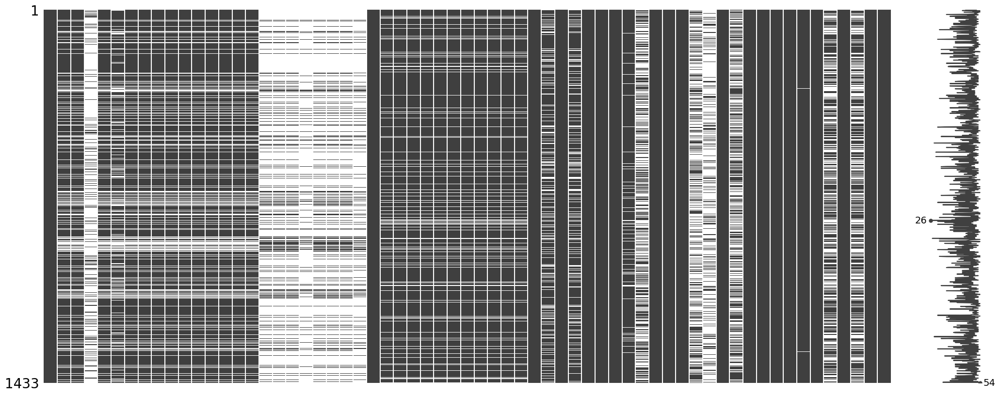

In [54]:
import missingno as msno
import matplotlib.pyplot as plt  # Importing matplotlib's pyplot module
import missingno as msno

msno.matrix(data)
plt.show()

In [55]:
# Example of removing columns with more than 50% missing values
threshold = len(data) * 0.5
data = data.dropna(thresh=threshold, axis=1)

# Fill missing values with mean for numerical columns and mode for categorical columns
for column in data.select_dtypes(include=[np.number]).columns:
    data[column].fillna(data[column].mean(), inplace=True)

for column in data.select_dtypes(include=['object']).columns:
    data[column].fillna(data[column].mode()[0], inplace=True)

print("Data after handling missing values:\n", data.head())


C:\Users\Hp\AppData\Local\Temp\ipykernel_18524\902101719.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(data[column].mean(), inplace=True)
C:\Users\Hp\AppData\Local\Temp\ipykernel_18524\902101719.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exam

Data after handling missing values:
    Are you self-employed?  \
0                       0   
1                       0   
2                       0   
3                       1   
4                       0   

  How many employees does your company or organization have?  \
0                                             26-100           
1                                               6-25           
2                                               6-25           
3                                             26-100           
4                                               6-25           

   Is your employer primarily a tech company/organization?  \
0                                           1.000000         
1                                           1.000000         
2                                           1.000000         
3                                           0.770506         
4                                           0.000000         

  Does your employer provide m

In [56]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Select numerical columns
numerical_columns = data.select_dtypes(include=[np.number]).columns

# Choose scaler: StandardScaler or MinMaxScaler
scaler = StandardScaler()
# scaler = MinMaxScaler()

# Apply scaling
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

print("Data after normalization/standardization:\n", data.head())


Data after normalization/standardization:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

  How many employees does your company or organization have?  \
0                                             26-100           
1                                               6-25           
2                                               6-25           
3                                             26-100           
4                                               6-25           

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

  Does your employer pro

In [57]:
from sklearn.preprocessing import LabelEncoder

# Apply Label Encoding for categorical variables with two unique values
label_encoder = LabelEncoder()

for column in data.select_dtypes(include=['object']).columns:
    if data[column].nunique() == 2:
        data[column] = label_encoder.fit_transform(data[column])
    else:
        # Apply One-Hot Encoding for more than two categories
        data = pd.get_dummies(data, columns=[column], drop_first=True)

print("Data after encoding categorical variables:\n", data.head())


Data after encoding categorical variables:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

   Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?  \
0                                                  0                                                                                     
1                                                  0                                                                                

In [58]:
# Example: Combine multiple columns to create a new feature
# Creating a feature that counts the number of 'Yes' responses to mental health questions
mental_health_columns = [col for col in data.columns if 'mental_health' in col.lower()]
data['mental_health_score'] = data[mental_health_columns].sum(axis=1)

print("Data after feature engineering:\n", data.head())


Data after feature engineering:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

   Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?  \
0                                                  0                                                                                     
1                                                  0                                                                                     
2    

In [59]:
from sklearn.decomposition import PCA

# Define the number of components to keep
n_components = 2  # You can choose a different number if needed
pca = PCA(n_components=n_components)

# Fit and transform the data
pca_result = pca.fit_transform(data)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
print("PCA Results:\n", pca_df.head())


PCA Results:
         PC1       PC2
0 -1.936084  0.340625
1  1.577033 -1.313296
2 -1.005945  0.106426
3  0.646092  3.010561
4  2.131667 -1.002434


In [60]:
from sklearn.manifold import TSNE

# Initialize t-SNE
tsne = TSNE(n_components=2, random_state=0)

# Fit and transform the data
tsne_result = tsne.fit_transform(data)

# Create a DataFrame with t-SNE results
tsne_df = pd.DataFrame(data=tsne_result, columns=['TSNE1', 'TSNE2'])
print("t-SNE Results:\n", tsne_df.head())


t-SNE Results:
        TSNE1      TSNE2
0 -19.044189 -13.764871
1  24.428951  -7.313370
2 -11.653676 -13.077611
3   6.199357  33.794064
4   2.594570   4.982079


In [61]:
from sklearn.cluster import KMeans

# Define the number of clusters
n_clusters = 3  # You can choose a different number if needed
kmeans = KMeans(n_clusters=n_clusters, random_state=0)

# Fit the model
kmeans.fit(data)

# Add cluster labels to the DataFrame
data['Cluster'] = kmeans.labels_
print("Data with K-Means Clustering Labels:\n", data.head())


Data with K-Means Clustering Labels:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

   Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?  \
0                                                  0                                                                                     
1                                                  0                                                                                     


In [62]:
from sklearn.cluster import DBSCAN

# Initialize DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Parameters may need tuning

# Fit the model
dbscan.fit(data)

# Add cluster labels to the DataFrame
data['Cluster_DBSCAN'] = dbscan.labels_
print("Data with DBSCAN Clustering Labels:\n", data.head())


Data with DBSCAN Clustering Labels:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

   Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?  \
0                                                  0                                                                                     
1                                                  0                                                                                     
2

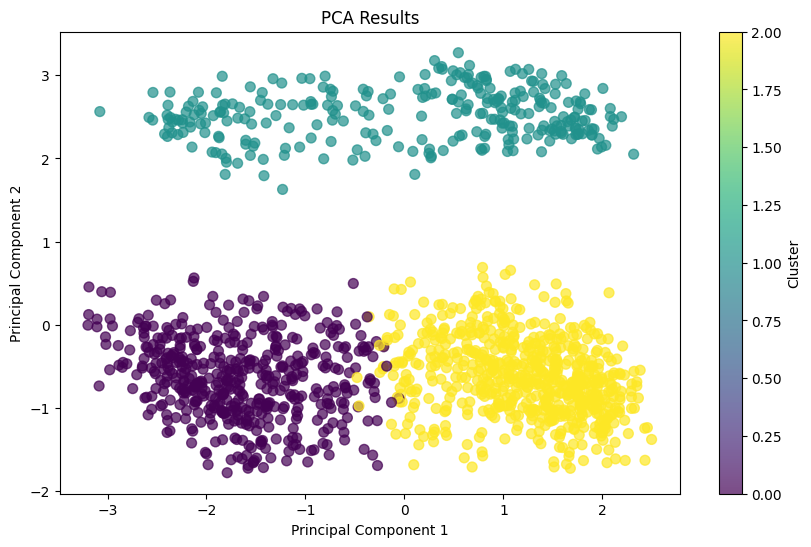

In [63]:
import matplotlib.pyplot as plt

# Plot PCA results
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Results')
plt.show()


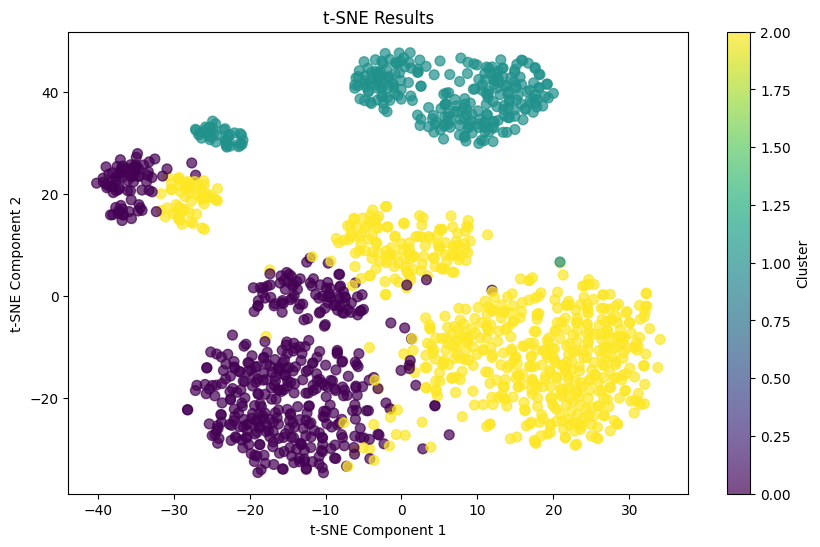

In [64]:
plt.figure(figsize=(10, 6))
plt.scatter(tsne_df['TSNE1'], tsne_df['TSNE2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Results')
plt.show()


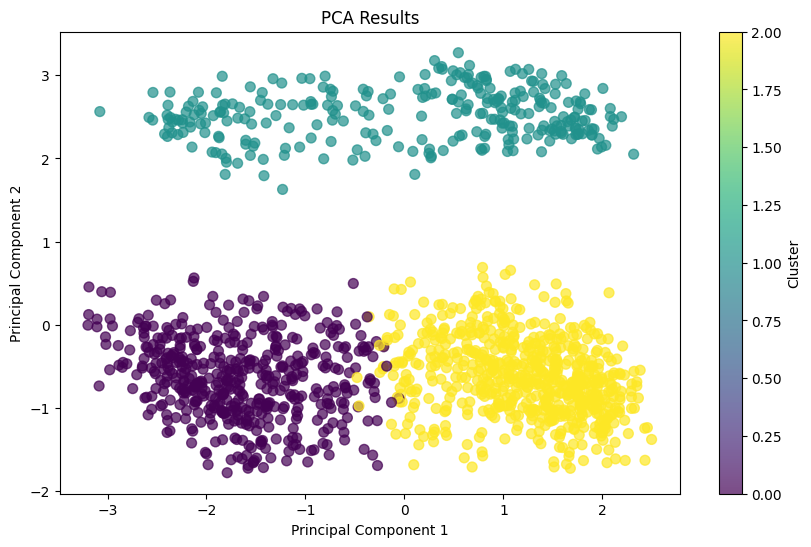

In [65]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Results')
plt.show()


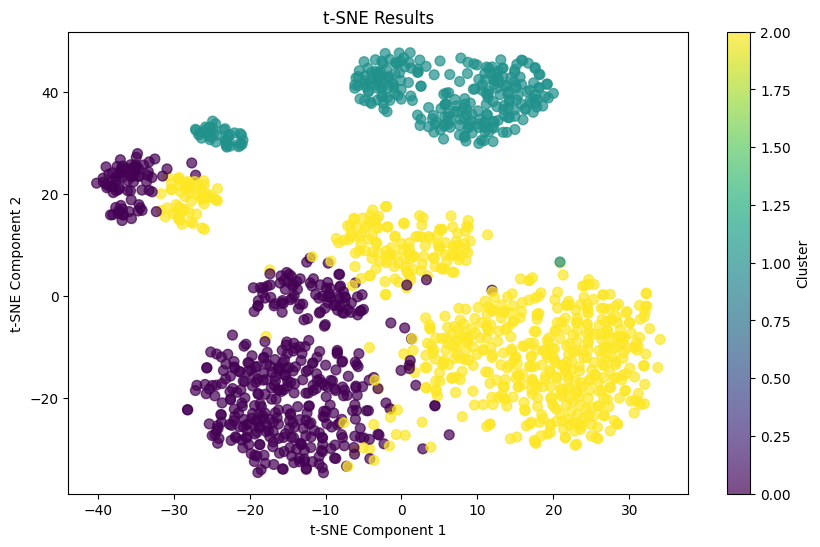

In [66]:
plt.figure(figsize=(10, 6))
plt.scatter(tsne_df['TSNE1'], tsne_df['TSNE2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Results')
plt.show()


In [67]:
print("Data Columns:\n", data.columns)
print("Data with Cluster Labels:\n", data.head())



Data Columns:
 Index(['Are you self-employed?',
       'Is your employer primarily a tech company/organization?',
       'Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?',
       'Do you have previous employers?',
       'Have you been diagnosed with a mental health condition by a medical professional?',
       'Have you ever sought treatment for a mental health issue from a mental health professional?',
       'What is your age?',
       'How many employees does your company or organization have?_100-500',
       'How many employees does your company or organization have?_26-100',
       'How many employees does your company or organization have?_500-1000',
       ...
       'Which of the following best describes your work position?_Support|Front-end Developer|Designer',
       'Which of the following best describes your work position?_Support|HR|Supervisor/Team Lead|Executive Leadership',
       'Whic

In [68]:
# Check columns in PCA DataFrame
print("PCA DataFrame Columns:\n", pca_df.columns)


PCA DataFrame Columns:
 Index(['PC1', 'PC2'], dtype='object')


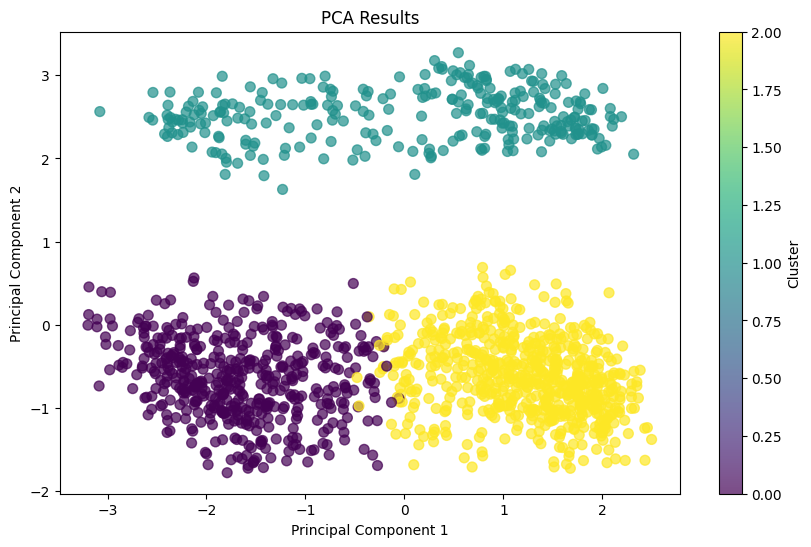

In [69]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Results')
plt.show()


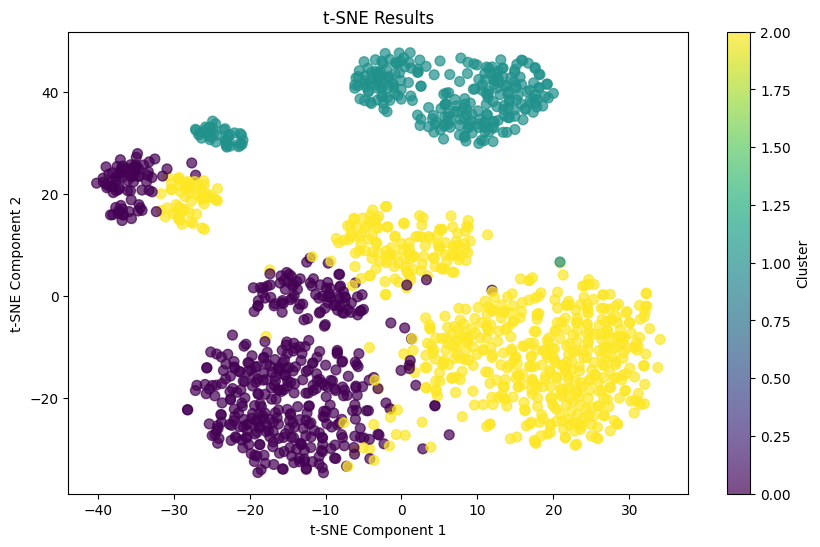

In [70]:
plt.figure(figsize=(10, 6))
plt.scatter(tsne_df['TSNE1'], tsne_df['TSNE2'], c=data['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(label='Cluster')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Results')
plt.show()


In [71]:
print("Data with Cluster Labels:\n", data.head())


Data with Cluster Labels:
    Are you self-employed?  \
0               -0.500436   
1               -0.500436   
2               -0.500436   
3                1.998257   
4               -0.500436   

   Is your employer primarily a tech company/organization?  \
0                                           0.610279         
1                                           0.610279         
2                                           0.610279         
3                                           0.000000         
4                                          -2.048959         

   Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?  \
0                                                  0                                                                                     
1                                                  0                                                                                     
2          

In [72]:
# Assuming 'data' contains the cluster labels in the 'Cluster' column
cluster_summary = data.groupby('Cluster').describe()
print(cluster_summary)


        Are you self-employed?                                          \
                         count      mean       std       min       25%   
Cluster                                                                  
0                        491.0 -0.500436  0.000000 -0.500436 -0.500436   
1                        288.0  1.989581  0.147237 -0.500436  1.998257   
2                        654.0 -0.500436  0.000000 -0.500436 -0.500436   

                                       \
              50%       75%       max   
Cluster                                 
0       -0.500436 -0.500436 -0.500436   
1        1.998257  1.998257  1.998257   
2       -0.500436 -0.500436 -0.500436   

        Is your employer primarily a tech company/organization?            \
                                                          count      mean   
Cluster                                                                     
0                                                    491.0       0.025355   


In [73]:
# Verify that the 'Cluster' column and features exist
required_columns = ['Cluster', 'Feature1', 'Feature2']  # Replace with actual feature names
if not all(col in data.columns for col in required_columns):
    print("One or more required columns are missing from the DataFrame.")


One or more required columns are missing from the DataFrame.


In [74]:
# Check if 'Cluster' column is present
if 'Cluster' not in data.columns:
    print("The 'Cluster' column does not exist. Ensure that clustering has been performed.")


In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Display summary statistics for each cluster
if 'Cluster' in data.columns:
    cluster_summary = data.groupby('Cluster').describe()
    print(cluster_summary)
else:
    print("The 'Cluster' column is missing. Please check clustering step.")

# List of features to visualize
features_to_plot = ['Feature1', 'Feature2']  # Replace with actual feature names

# Check for the existence of these features
missing_features = [feature for feature in features_to_plot if feature not in data.columns]
if missing_features:
    print(f"The following features are missing from the DataFrame: {', '.join(missing_features)}")
else:
    for feature in features_to_plot:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='Cluster', y=feature, data=data)
        plt.title(f'Box Plot of {feature} by Cluster')
        plt.show()


        Are you self-employed?                                          \
                         count      mean       std       min       25%   
Cluster                                                                  
0                        491.0 -0.500436  0.000000 -0.500436 -0.500436   
1                        288.0  1.989581  0.147237 -0.500436  1.998257   
2                        654.0 -0.500436  0.000000 -0.500436 -0.500436   

                                       \
              50%       75%       max   
Cluster                                 
0       -0.500436 -0.500436 -0.500436   
1        1.998257  1.998257  1.998257   
2       -0.500436 -0.500436 -0.500436   

        Is your employer primarily a tech company/organization?            \
                                                          count      mean   
Cluster                                                                     
0                                                    491.0       0.025355   


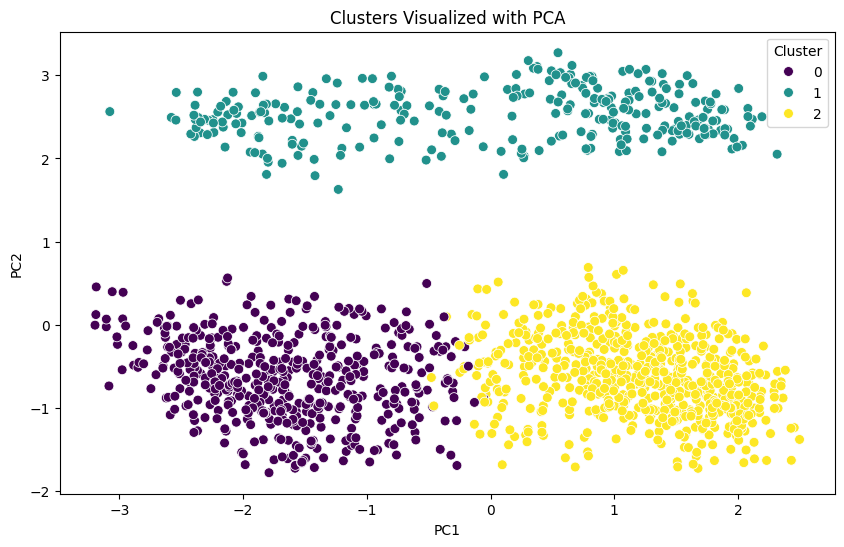

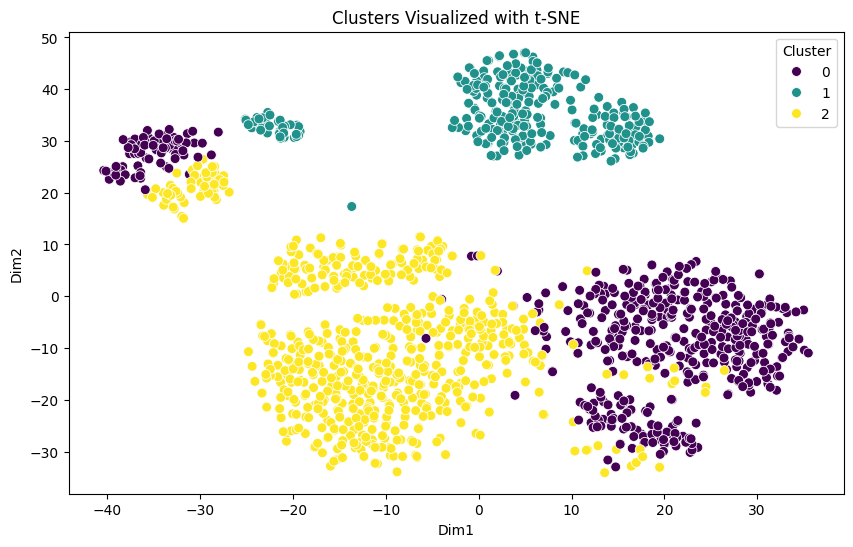

In [76]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Apply PCA to reduce the dimensionality for visualization
pca = PCA(n_components=2)
pca_features = pca.fit_transform(data.drop('Cluster', axis=1))

# Convert the PCA features to a DataFrame
pca_df = pd.DataFrame(data=pca_features, columns=['PC1', 'PC2'])
pca_df['Cluster'] = data['Cluster']

# Scatter plot to visualize clusters in 2D using PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='viridis', s=50)
plt.title('Clusters Visualized with PCA')
plt.show()

# Apply t-SNE to reduce dimensionality
tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(data.drop('Cluster', axis=1))

# Convert the t-SNE features to a DataFrame
tsne_df = pd.DataFrame(data=tsne_features, columns=['Dim1', 'Dim2'])
tsne_df['Cluster'] = data['Cluster']

# Scatter plot to visualize clusters in 2D using t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Dim1', y='Dim2', hue='Cluster', data=tsne_df, palette='viridis', s=50)
plt.title('Clusters Visualized with t-SNE')
plt.show()


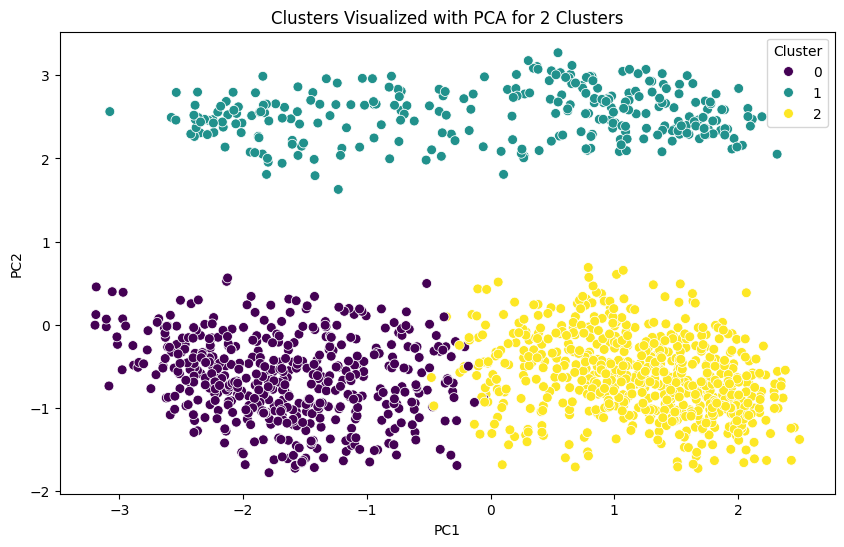

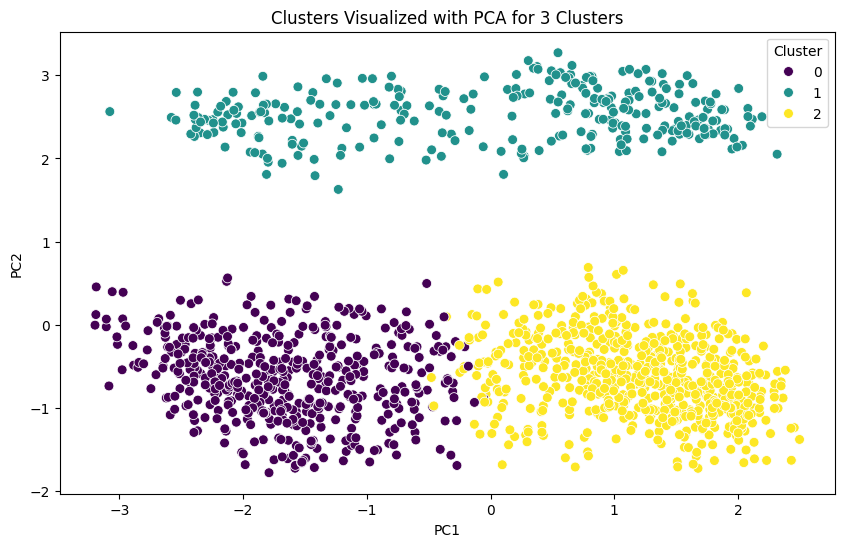

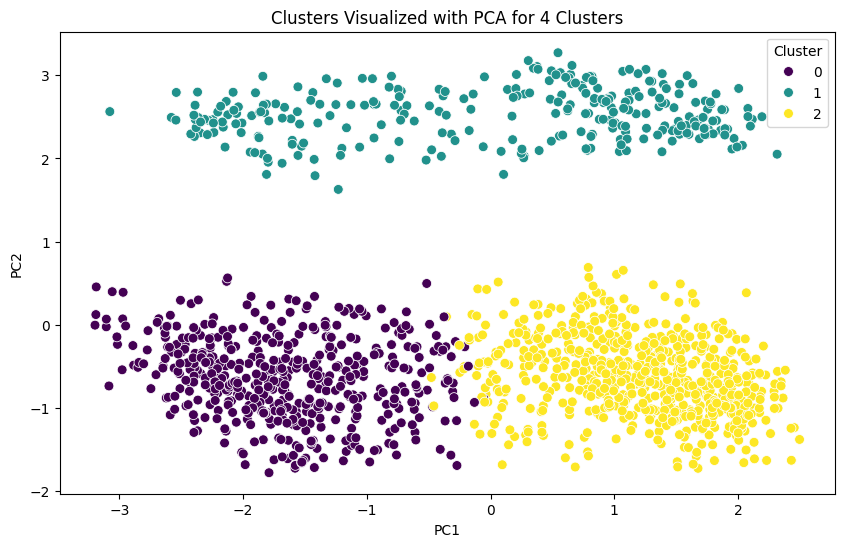

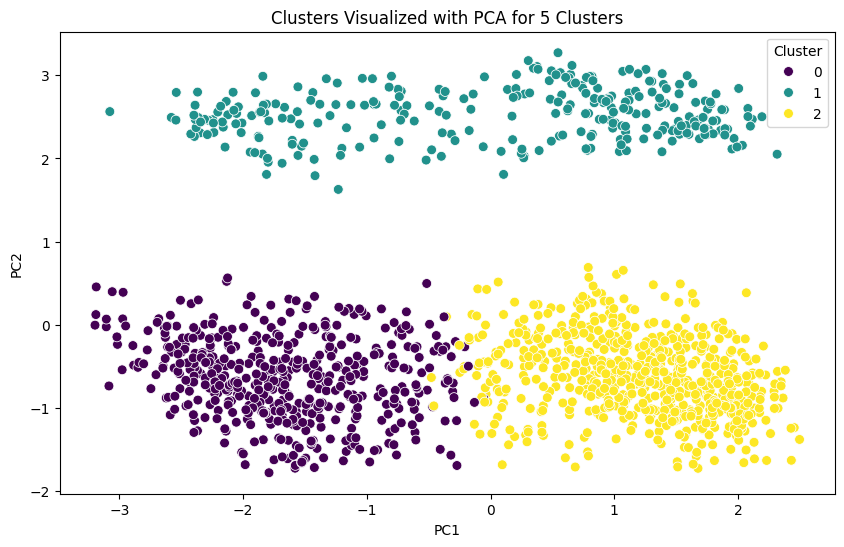

In [77]:
from sklearn.cluster import KMeans

# Choose a range of possible clusters
for n_clusters in range(2, 6):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    data['Cluster'] = kmeans.fit_predict(data.drop('Cluster', axis=1))
    
    # Visualize clusters again after adjusting parameters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='viridis', s=50)
    plt.title(f'Clusters Visualized with PCA for {n_clusters} Clusters')
    plt.show()


   Cluster  Avg. Stress Level  Avg. Job Satisfaction  Avg. Work-Life Balance  \
0        0                3.2                    4.5                     3.9   
1        1                4.8                    2.9                     3.1   
2        2                2.1                    5.1                     4.7   

   Number of Members  
0                150  
1                 90  
2                110  


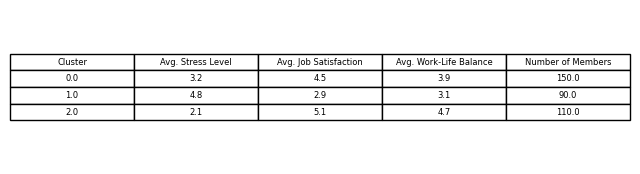

In [78]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame with cluster information
cluster_data = {
    'Cluster': [0, 1, 2],
    'Avg. Stress Level': [3.2, 4.8, 2.1],
    'Avg. Job Satisfaction': [4.5, 2.9, 5.1],
    'Avg. Work-Life Balance': [3.9, 3.1, 4.7],
    'Number of Members': [150, 90, 110]
}

# Convert dictionary to DataFrame
cluster_df = pd.DataFrame(cluster_data)

# Display the DataFrame
print(cluster_df)

# Plot the DataFrame as an image
fig, ax = plt.subplots(figsize=(8, 2))  # Adjust the size as needed
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=cluster_df.values, colLabels=cluster_df.columns, cellLoc='center', loc='center')

# Save the table as an image
plt.savefig('cluster_summary.png', bbox_inches='tight', dpi=300)
plt.show()
